In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
!ls '/content/drive/My Drive/Celeb.zip'

'/content/drive/My Drive/Celeb.zip'


In [ ]:
!unzip '/content/drive/My Drive/Celeb.zip'

In [4]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [5]:
dataroot = "img_align_celeba"
workers = 2
batch_size = 128
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 5
lr = 0.0002
beta1 = 0.5
ngpu = 1

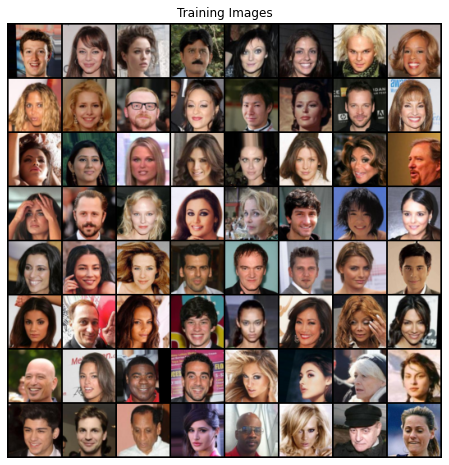

In [6]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [7]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
netG = Generator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [10]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [11]:
netD = Discriminator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [12]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1.
fake_label = 0.

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [23]:
import torchvision

In [24]:
def show(x, title=None):
    grid_image = torchvision.utils.make_grid(x, normalize=True).numpy()
    if title:
        plt.title(title)
    plt.axis('off')
    plt.imshow(np.transpose(grid_image, (1, 2, 0)))
    plt.show()

Starting Training Loop...
[0/5][0/1583]	Loss_D: 0.4710	Loss_G: 8.3250	D(x): 0.8972	D(G(z)): 0.2085 / 0.0004


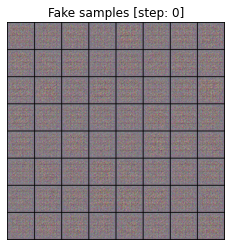

[0/5][50/1583]	Loss_D: 2.0857	Loss_G: 23.1760	D(x): 0.9009	D(G(z)): 0.7530 / 0.0000
[0/5][100/1583]	Loss_D: 0.2368	Loss_G: 5.7363	D(x): 0.8809	D(G(z)): 0.0065 / 0.0069
[0/5][150/1583]	Loss_D: 0.6762	Loss_G: 5.6174	D(x): 0.9508	D(G(z)): 0.3946 / 0.0125
[0/5][200/1583]	Loss_D: 0.2101	Loss_G: 5.3475	D(x): 0.8834	D(G(z)): 0.0606 / 0.0072
[0/5][250/1583]	Loss_D: 0.6545	Loss_G: 6.6051	D(x): 0.6102	D(G(z)): 0.0051 / 0.0033
[0/5][300/1583]	Loss_D: 0.4191	Loss_G: 4.8056	D(x): 0.8910	D(G(z)): 0.2273 / 0.0144
[0/5][350/1583]	Loss_D: 0.5068	Loss_G: 4.1030	D(x): 0.8545	D(G(z)): 0.2474 / 0.0256
[0/5][400/1583]	Loss_D: 0.3401	Loss_G: 3.2944	D(x): 0.8988	D(G(z)): 0.1668 / 0.0731
[0/5][450/1583]	Loss_D: 0.4757	Loss_G: 7.4579	D(x): 0.8852	D(G(z)): 0.2323 / 0.0017
[0/5][500/1583]	Loss_D: 0.6842	Loss_G: 7.5590	D(x): 0.9183	D(G(z)): 0.3932 / 0.0014


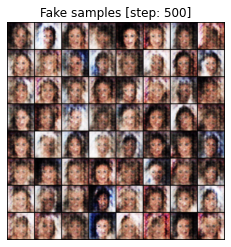

[0/5][550/1583]	Loss_D: 0.5279	Loss_G: 4.1570	D(x): 0.7267	D(G(z)): 0.0658 / 0.0281
[0/5][600/1583]	Loss_D: 0.5902	Loss_G: 3.6005	D(x): 0.7587	D(G(z)): 0.2122 / 0.0402
[0/5][650/1583]	Loss_D: 0.5138	Loss_G: 7.2872	D(x): 0.9364	D(G(z)): 0.3158 / 0.0013
[0/5][700/1583]	Loss_D: 0.3997	Loss_G: 3.6255	D(x): 0.8290	D(G(z)): 0.1207 / 0.0611
[0/5][750/1583]	Loss_D: 0.5646	Loss_G: 4.3776	D(x): 0.7808	D(G(z)): 0.2112 / 0.0233
[0/5][800/1583]	Loss_D: 0.5586	Loss_G: 5.2058	D(x): 0.8883	D(G(z)): 0.2992 / 0.0151
[0/5][850/1583]	Loss_D: 0.4096	Loss_G: 3.6856	D(x): 0.7624	D(G(z)): 0.0523 / 0.0383
[0/5][900/1583]	Loss_D: 0.4836	Loss_G: 6.2642	D(x): 0.9232	D(G(z)): 0.2984 / 0.0040
[0/5][950/1583]	Loss_D: 0.0941	Loss_G: 4.6996	D(x): 0.9765	D(G(z)): 0.0550 / 0.0336
[0/5][1000/1583]	Loss_D: 0.6661	Loss_G: 5.0942	D(x): 0.8633	D(G(z)): 0.3138 / 0.0129


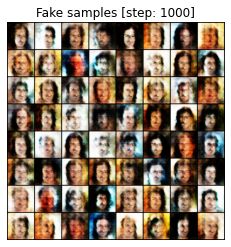

[0/5][1050/1583]	Loss_D: 0.5088	Loss_G: 4.9255	D(x): 0.8467	D(G(z)): 0.2278 / 0.0129
[0/5][1100/1583]	Loss_D: 0.5889	Loss_G: 3.7856	D(x): 0.7777	D(G(z)): 0.2112 / 0.0433
[0/5][1150/1583]	Loss_D: 0.3590	Loss_G: 3.9997	D(x): 0.8537	D(G(z)): 0.1451 / 0.0317
[0/5][1200/1583]	Loss_D: 0.8149	Loss_G: 4.0034	D(x): 0.5545	D(G(z)): 0.0071 / 0.0387
[0/5][1250/1583]	Loss_D: 1.1273	Loss_G: 4.5121	D(x): 0.4436	D(G(z)): 0.0087 / 0.0322
[0/5][1300/1583]	Loss_D: 0.9724	Loss_G: 7.1760	D(x): 0.8688	D(G(z)): 0.4863 / 0.0025
[0/5][1350/1583]	Loss_D: 0.4876	Loss_G: 4.1964	D(x): 0.8259	D(G(z)): 0.2104 / 0.0260
[0/5][1400/1583]	Loss_D: 1.4637	Loss_G: 7.8809	D(x): 0.9915	D(G(z)): 0.6601 / 0.0013
[0/5][1450/1583]	Loss_D: 0.6007	Loss_G: 5.0559	D(x): 0.8570	D(G(z)): 0.3092 / 0.0110
[0/5][1500/1583]	Loss_D: 1.5353	Loss_G: 5.9005	D(x): 0.9764	D(G(z)): 0.6605 / 0.0059


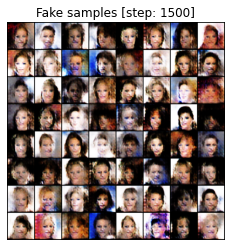

[0/5][1550/1583]	Loss_D: 0.8281	Loss_G: 2.7201	D(x): 0.5443	D(G(z)): 0.0120 / 0.1431
[1/5][0/1583]	Loss_D: 0.2624	Loss_G: 4.2989	D(x): 0.8903	D(G(z)): 0.1125 / 0.0216
[1/5][50/1583]	Loss_D: 0.6435	Loss_G: 2.9355	D(x): 0.6473	D(G(z)): 0.0723 / 0.1029
[1/5][100/1583]	Loss_D: 1.1934	Loss_G: 1.1581	D(x): 0.4337	D(G(z)): 0.0344 / 0.3893
[1/5][150/1583]	Loss_D: 0.4219	Loss_G: 3.3122	D(x): 0.7618	D(G(z)): 0.0752 / 0.0538
[1/5][200/1583]	Loss_D: 0.6025	Loss_G: 3.1208	D(x): 0.6635	D(G(z)): 0.0553 / 0.0696
[1/5][250/1583]	Loss_D: 1.5516	Loss_G: 0.2339	D(x): 0.3167	D(G(z)): 0.0131 / 0.8063
[1/5][300/1583]	Loss_D: 0.4610	Loss_G: 3.7013	D(x): 0.8787	D(G(z)): 0.2422 / 0.0400
[1/5][350/1583]	Loss_D: 0.6361	Loss_G: 5.1783	D(x): 0.8940	D(G(z)): 0.3613 / 0.0091
[1/5][400/1583]	Loss_D: 1.7219	Loss_G: 1.8337	D(x): 0.3163	D(G(z)): 0.0039 / 0.2441


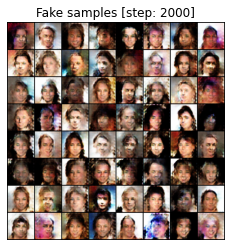

[1/5][450/1583]	Loss_D: 0.6519	Loss_G: 3.9539	D(x): 0.7955	D(G(z)): 0.2674 / 0.0320
[1/5][500/1583]	Loss_D: 0.6498	Loss_G: 5.8760	D(x): 0.8950	D(G(z)): 0.3540 / 0.0081
[1/5][550/1583]	Loss_D: 2.3433	Loss_G: 2.0908	D(x): 0.2022	D(G(z)): 0.0009 / 0.2084
[1/5][600/1583]	Loss_D: 0.7567	Loss_G: 6.2464	D(x): 0.9486	D(G(z)): 0.4559 / 0.0038
[1/5][650/1583]	Loss_D: 0.3362	Loss_G: 4.7193	D(x): 0.8018	D(G(z)): 0.0787 / 0.0182
[1/5][700/1583]	Loss_D: 0.4059	Loss_G: 4.6073	D(x): 0.8834	D(G(z)): 0.2026 / 0.0168
[1/5][750/1583]	Loss_D: 1.3552	Loss_G: 7.7851	D(x): 0.9839	D(G(z)): 0.6576 / 0.0009
[1/5][800/1583]	Loss_D: 0.5411	Loss_G: 5.6727	D(x): 0.8935	D(G(z)): 0.3091 / 0.0053
[1/5][850/1583]	Loss_D: 0.3947	Loss_G: 3.4463	D(x): 0.8197	D(G(z)): 0.1277 / 0.0457
[1/5][900/1583]	Loss_D: 0.7460	Loss_G: 1.9199	D(x): 0.6219	D(G(z)): 0.1112 / 0.1967


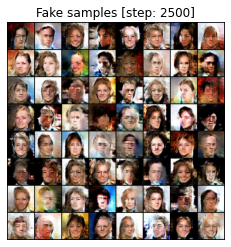

[1/5][950/1583]	Loss_D: 0.5732	Loss_G: 2.6203	D(x): 0.7380	D(G(z)): 0.1766 / 0.1004
[1/5][1000/1583]	Loss_D: 0.5271	Loss_G: 4.7041	D(x): 0.8973	D(G(z)): 0.3073 / 0.0150
[1/5][1050/1583]	Loss_D: 0.7778	Loss_G: 5.3574	D(x): 0.9289	D(G(z)): 0.4525 / 0.0089
[1/5][1100/1583]	Loss_D: 0.5960	Loss_G: 3.6368	D(x): 0.8331	D(G(z)): 0.2945 / 0.0361
[1/5][1150/1583]	Loss_D: 0.6945	Loss_G: 4.0809	D(x): 0.7996	D(G(z)): 0.3202 / 0.0274
[1/5][1200/1583]	Loss_D: 2.1350	Loss_G: 8.3702	D(x): 0.9799	D(G(z)): 0.8128 / 0.0010
[1/5][1250/1583]	Loss_D: 0.8067	Loss_G: 5.0989	D(x): 0.9096	D(G(z)): 0.4554 / 0.0110
[1/5][1300/1583]	Loss_D: 1.7402	Loss_G: 6.2868	D(x): 0.9761	D(G(z)): 0.7622 / 0.0073
[1/5][1350/1583]	Loss_D: 0.4569	Loss_G: 2.7942	D(x): 0.7338	D(G(z)): 0.0838 / 0.0877
[1/5][1400/1583]	Loss_D: 0.6212	Loss_G: 3.7839	D(x): 0.8806	D(G(z)): 0.3339 / 0.0381


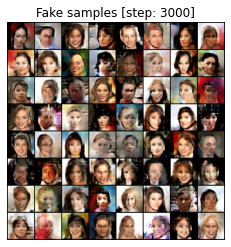

[1/5][1450/1583]	Loss_D: 0.6200	Loss_G: 3.4027	D(x): 0.8767	D(G(z)): 0.3305 / 0.0549
[1/5][1500/1583]	Loss_D: 0.5785	Loss_G: 2.2753	D(x): 0.6693	D(G(z)): 0.0861 / 0.1441
[1/5][1550/1583]	Loss_D: 0.5665	Loss_G: 2.8468	D(x): 0.7980	D(G(z)): 0.2422 / 0.0813
[2/5][0/1583]	Loss_D: 0.5920	Loss_G: 2.7407	D(x): 0.7225	D(G(z)): 0.1736 / 0.0934
[2/5][50/1583]	Loss_D: 0.5371	Loss_G: 2.6990	D(x): 0.7199	D(G(z)): 0.1383 / 0.0924
[2/5][100/1583]	Loss_D: 0.5029	Loss_G: 2.9497	D(x): 0.8530	D(G(z)): 0.2582 / 0.0718
[2/5][150/1583]	Loss_D: 1.1367	Loss_G: 1.5067	D(x): 0.4178	D(G(z)): 0.0591 / 0.2895
[2/5][200/1583]	Loss_D: 0.5791	Loss_G: 3.3291	D(x): 0.8386	D(G(z)): 0.2919 / 0.0511
[2/5][250/1583]	Loss_D: 1.2911	Loss_G: 4.7050	D(x): 0.9091	D(G(z)): 0.6189 / 0.0225
[2/5][300/1583]	Loss_D: 1.0818	Loss_G: 0.9205	D(x): 0.4228	D(G(z)): 0.0415 / 0.4614


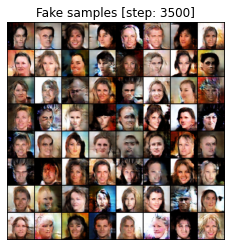

[2/5][350/1583]	Loss_D: 0.5290	Loss_G: 2.4099	D(x): 0.6986	D(G(z)): 0.1031 / 0.1360
[2/5][400/1583]	Loss_D: 1.0091	Loss_G: 5.4604	D(x): 0.9519	D(G(z)): 0.5585 / 0.0063
[2/5][450/1583]	Loss_D: 0.8976	Loss_G: 1.3073	D(x): 0.5007	D(G(z)): 0.0620 / 0.3386
[2/5][500/1583]	Loss_D: 0.7518	Loss_G: 4.4996	D(x): 0.9186	D(G(z)): 0.4422 / 0.0161
[2/5][550/1583]	Loss_D: 0.7785	Loss_G: 1.4736	D(x): 0.5620	D(G(z)): 0.0667 / 0.2858
[2/5][600/1583]	Loss_D: 1.2982	Loss_G: 6.0351	D(x): 0.9814	D(G(z)): 0.6701 / 0.0044
[2/5][650/1583]	Loss_D: 0.9174	Loss_G: 4.4731	D(x): 0.9408	D(G(z)): 0.5253 / 0.0180
[2/5][700/1583]	Loss_D: 0.5050	Loss_G: 2.2596	D(x): 0.6976	D(G(z)): 0.0853 / 0.1345
[2/5][750/1583]	Loss_D: 2.6324	Loss_G: 0.2533	D(x): 0.1257	D(G(z)): 0.0346 / 0.8159
[2/5][800/1583]	Loss_D: 0.5199	Loss_G: 2.3946	D(x): 0.7182	D(G(z)): 0.1356 / 0.1219


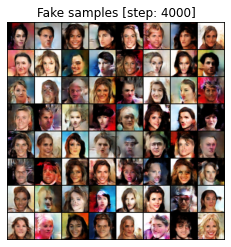

[2/5][850/1583]	Loss_D: 0.5415	Loss_G: 2.2267	D(x): 0.7470	D(G(z)): 0.1843 / 0.1398
[2/5][900/1583]	Loss_D: 0.7118	Loss_G: 3.2620	D(x): 0.8339	D(G(z)): 0.3621 / 0.0500
[2/5][950/1583]	Loss_D: 0.5344	Loss_G: 2.5165	D(x): 0.7567	D(G(z)): 0.1900 / 0.1029
[2/5][1000/1583]	Loss_D: 0.5431	Loss_G: 4.0651	D(x): 0.8903	D(G(z)): 0.3158 / 0.0251
[2/5][1050/1583]	Loss_D: 0.7439	Loss_G: 3.7346	D(x): 0.9136	D(G(z)): 0.4318 / 0.0366
[2/5][1100/1583]	Loss_D: 0.5210	Loss_G: 3.2653	D(x): 0.8400	D(G(z)): 0.2568 / 0.0528
[2/5][1150/1583]	Loss_D: 0.5124	Loss_G: 2.8435	D(x): 0.8828	D(G(z)): 0.2838 / 0.0775
[2/5][1200/1583]	Loss_D: 0.5948	Loss_G: 2.5166	D(x): 0.6594	D(G(z)): 0.1096 / 0.1133
[2/5][1250/1583]	Loss_D: 0.8459	Loss_G: 2.1310	D(x): 0.8452	D(G(z)): 0.4271 / 0.1597
[2/5][1300/1583]	Loss_D: 0.9137	Loss_G: 3.8390	D(x): 0.9315	D(G(z)): 0.5262 / 0.0321


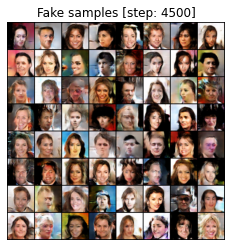

[2/5][1350/1583]	Loss_D: 0.8452	Loss_G: 0.7049	D(x): 0.5204	D(G(z)): 0.0871 / 0.5377
[2/5][1400/1583]	Loss_D: 1.1343	Loss_G: 1.0215	D(x): 0.4799	D(G(z)): 0.2232 / 0.4076
[2/5][1450/1583]	Loss_D: 0.6534	Loss_G: 2.1626	D(x): 0.6504	D(G(z)): 0.1490 / 0.1485
[2/5][1500/1583]	Loss_D: 0.4301	Loss_G: 2.5154	D(x): 0.7524	D(G(z)): 0.1040 / 0.1191
[2/5][1550/1583]	Loss_D: 0.6961	Loss_G: 1.5893	D(x): 0.5993	D(G(z)): 0.0928 / 0.2517
[3/5][0/1583]	Loss_D: 0.4229	Loss_G: 2.8545	D(x): 0.7835	D(G(z)): 0.1335 / 0.0763
[3/5][50/1583]	Loss_D: 2.1636	Loss_G: 0.5671	D(x): 0.1682	D(G(z)): 0.0102 / 0.6347
[3/5][100/1583]	Loss_D: 0.4594	Loss_G: 2.4652	D(x): 0.7634	D(G(z)): 0.1458 / 0.1097
[3/5][150/1583]	Loss_D: 0.5822	Loss_G: 2.2340	D(x): 0.7491	D(G(z)): 0.2155 / 0.1446
[3/5][200/1583]	Loss_D: 0.8983	Loss_G: 0.8911	D(x): 0.5027	D(G(z)): 0.0982 / 0.4562
[3/5][250/1583]	Loss_D: 0.5986	Loss_G: 2.9595	D(x): 0.8771	D(G(z)): 0.3394 / 0.0707


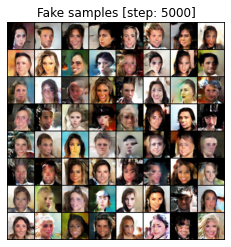

[3/5][300/1583]	Loss_D: 0.4398	Loss_G: 3.1847	D(x): 0.8447	D(G(z)): 0.2079 / 0.0556
[3/5][350/1583]	Loss_D: 0.7426	Loss_G: 3.5819	D(x): 0.8792	D(G(z)): 0.4220 / 0.0387
[3/5][400/1583]	Loss_D: 0.6668	Loss_G: 3.3989	D(x): 0.9256	D(G(z)): 0.3902 / 0.0493
[3/5][450/1583]	Loss_D: 0.9550	Loss_G: 4.6376	D(x): 0.9478	D(G(z)): 0.5502 / 0.0136
[3/5][500/1583]	Loss_D: 0.7908	Loss_G: 1.2461	D(x): 0.5393	D(G(z)): 0.0768 / 0.3437
[3/5][550/1583]	Loss_D: 0.5192	Loss_G: 2.4930	D(x): 0.7663	D(G(z)): 0.1930 / 0.1089
[3/5][600/1583]	Loss_D: 0.7596	Loss_G: 3.0261	D(x): 0.8535	D(G(z)): 0.3975 / 0.0637
[3/5][650/1583]	Loss_D: 0.7012	Loss_G: 1.7017	D(x): 0.6191	D(G(z)): 0.1329 / 0.2297
[3/5][700/1583]	Loss_D: 0.9105	Loss_G: 3.8967	D(x): 0.8765	D(G(z)): 0.4803 / 0.0343
[3/5][750/1583]	Loss_D: 0.7469	Loss_G: 1.6035	D(x): 0.6261	D(G(z)): 0.1808 / 0.2431


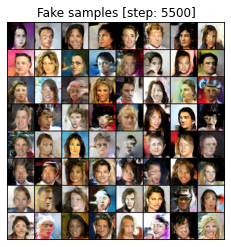

[3/5][800/1583]	Loss_D: 0.3581	Loss_G: 3.0118	D(x): 0.8041	D(G(z)): 0.1080 / 0.0656
[3/5][850/1583]	Loss_D: 0.5828	Loss_G: 2.6959	D(x): 0.8120	D(G(z)): 0.2796 / 0.0884
[3/5][900/1583]	Loss_D: 0.6123	Loss_G: 1.6794	D(x): 0.6055	D(G(z)): 0.0454 / 0.2345
[3/5][950/1583]	Loss_D: 0.4471	Loss_G: 3.0052	D(x): 0.8455	D(G(z)): 0.2151 / 0.0657
[3/5][1000/1583]	Loss_D: 0.7179	Loss_G: 1.5596	D(x): 0.5934	D(G(z)): 0.0944 / 0.2550
[3/5][1050/1583]	Loss_D: 0.9488	Loss_G: 0.9238	D(x): 0.5082	D(G(z)): 0.1200 / 0.4323
[3/5][1100/1583]	Loss_D: 0.5494	Loss_G: 2.4013	D(x): 0.7810	D(G(z)): 0.2287 / 0.1143
[3/5][1150/1583]	Loss_D: 1.1147	Loss_G: 3.4045	D(x): 0.9107	D(G(z)): 0.5778 / 0.0475
[3/5][1200/1583]	Loss_D: 0.6033	Loss_G: 2.2376	D(x): 0.7095	D(G(z)): 0.1934 / 0.1351
[3/5][1250/1583]	Loss_D: 0.7082	Loss_G: 2.4413	D(x): 0.7989	D(G(z)): 0.3533 / 0.1029


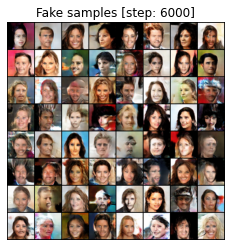

[3/5][1300/1583]	Loss_D: 0.4969	Loss_G: 2.1822	D(x): 0.6918	D(G(z)): 0.0732 / 0.1405
[3/5][1350/1583]	Loss_D: 0.4771	Loss_G: 2.1838	D(x): 0.7666	D(G(z)): 0.1609 / 0.1433
[3/5][1400/1583]	Loss_D: 0.5526	Loss_G: 3.0934	D(x): 0.8117	D(G(z)): 0.2597 / 0.0596
[3/5][1450/1583]	Loss_D: 0.8966	Loss_G: 3.3044	D(x): 0.8791	D(G(z)): 0.4917 / 0.0526
[3/5][1500/1583]	Loss_D: 1.0079	Loss_G: 4.2614	D(x): 0.9265	D(G(z)): 0.5566 / 0.0209
[3/5][1550/1583]	Loss_D: 0.9718	Loss_G: 3.7491	D(x): 0.9060	D(G(z)): 0.5322 / 0.0327
[4/5][0/1583]	Loss_D: 0.6756	Loss_G: 1.8027	D(x): 0.5879	D(G(z)): 0.0597 / 0.2004
[4/5][50/1583]	Loss_D: 0.6500	Loss_G: 2.2544	D(x): 0.7799	D(G(z)): 0.2891 / 0.1290
[4/5][100/1583]	Loss_D: 0.6032	Loss_G: 3.0874	D(x): 0.8207	D(G(z)): 0.2911 / 0.0624
[4/5][150/1583]	Loss_D: 0.5657	Loss_G: 1.9036	D(x): 0.6664	D(G(z)): 0.1086 / 0.1856


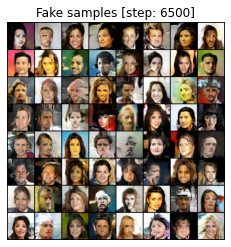

[4/5][200/1583]	Loss_D: 0.9314	Loss_G: 1.4850	D(x): 0.5454	D(G(z)): 0.1754 / 0.2707
[4/5][250/1583]	Loss_D: 0.8194	Loss_G: 1.2476	D(x): 0.5696	D(G(z)): 0.1451 / 0.3321
[4/5][300/1583]	Loss_D: 0.4244	Loss_G: 2.9078	D(x): 0.8329	D(G(z)): 0.1927 / 0.0705
[4/5][350/1583]	Loss_D: 1.0120	Loss_G: 0.6033	D(x): 0.4439	D(G(z)): 0.0714 / 0.5775
[4/5][400/1583]	Loss_D: 1.2872	Loss_G: 0.5072	D(x): 0.3661	D(G(z)): 0.0628 / 0.6638
[4/5][450/1583]	Loss_D: 0.5234	Loss_G: 2.5128	D(x): 0.8554	D(G(z)): 0.2755 / 0.1049
[4/5][500/1583]	Loss_D: 0.7283	Loss_G: 2.1996	D(x): 0.6808	D(G(z)): 0.2435 / 0.1345
[4/5][550/1583]	Loss_D: 0.7204	Loss_G: 3.5536	D(x): 0.8346	D(G(z)): 0.3741 / 0.0397
[4/5][600/1583]	Loss_D: 0.7364	Loss_G: 3.2312	D(x): 0.9136	D(G(z)): 0.4359 / 0.0507
[4/5][650/1583]	Loss_D: 2.1535	Loss_G: 5.9581	D(x): 0.9739	D(G(z)): 0.8291 / 0.0051


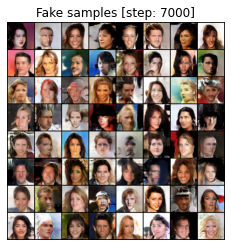

[4/5][700/1583]	Loss_D: 0.5460	Loss_G: 2.4091	D(x): 0.7710	D(G(z)): 0.2128 / 0.1153
[4/5][750/1583]	Loss_D: 0.6852	Loss_G: 1.5855	D(x): 0.6681	D(G(z)): 0.1894 / 0.2354
[4/5][800/1583]	Loss_D: 0.6524	Loss_G: 3.0543	D(x): 0.8516	D(G(z)): 0.3514 / 0.0609
[4/5][850/1583]	Loss_D: 0.5066	Loss_G: 2.6045	D(x): 0.7830	D(G(z)): 0.1974 / 0.0962
[4/5][900/1583]	Loss_D: 1.9075	Loss_G: 0.9045	D(x): 0.2041	D(G(z)): 0.0235 / 0.4779
[4/5][950/1583]	Loss_D: 0.5286	Loss_G: 2.6592	D(x): 0.8181	D(G(z)): 0.2503 / 0.0904
[4/5][1000/1583]	Loss_D: 2.7955	Loss_G: 0.3440	D(x): 0.1032	D(G(z)): 0.0059 / 0.7376
[4/5][1050/1583]	Loss_D: 0.6629	Loss_G: 1.6932	D(x): 0.6202	D(G(z)): 0.1075 / 0.2362
[4/5][1100/1583]	Loss_D: 0.8053	Loss_G: 4.0501	D(x): 0.8709	D(G(z)): 0.4240 / 0.0277
[4/5][1150/1583]	Loss_D: 0.4406	Loss_G: 2.5209	D(x): 0.7975	D(G(z)): 0.1638 / 0.1130


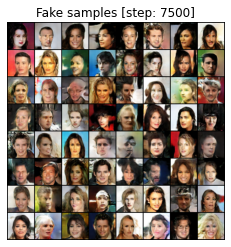

[4/5][1200/1583]	Loss_D: 0.3736	Loss_G: 2.4330	D(x): 0.8164	D(G(z)): 0.1353 / 0.1188
[4/5][1250/1583]	Loss_D: 1.1997	Loss_G: 3.6134	D(x): 0.8661	D(G(z)): 0.5689 / 0.0445
[4/5][1300/1583]	Loss_D: 0.4196	Loss_G: 2.6213	D(x): 0.7316	D(G(z)): 0.0748 / 0.0961
[4/5][1350/1583]	Loss_D: 0.8540	Loss_G: 2.1141	D(x): 0.6885	D(G(z)): 0.3256 / 0.1517
[4/5][1400/1583]	Loss_D: 0.6606	Loss_G: 1.9275	D(x): 0.6940	D(G(z)): 0.2114 / 0.1830
[4/5][1450/1583]	Loss_D: 0.6219	Loss_G: 1.4817	D(x): 0.6636	D(G(z)): 0.1362 / 0.2777
[4/5][1500/1583]	Loss_D: 0.6572	Loss_G: 1.7706	D(x): 0.6262	D(G(z)): 0.1082 / 0.2058
[4/5][1550/1583]	Loss_D: 0.6974	Loss_G: 1.8813	D(x): 0.6677	D(G(z)): 0.1991 / 0.1879


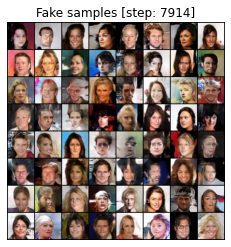

In [25]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        netD.zero_grad()
        real_cpu = data[0].to(device)
        output = netD(real_cpu).view(-1)
        b_size = output.size(0)
        label = torch.full((b_size,), real_label, device=device)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        label.fill_(real_label) 
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        G_losses.append(errG.item())
        D_losses.append(errD.item())
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            show(fake, f'Fake samples [step: {iters}]')
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

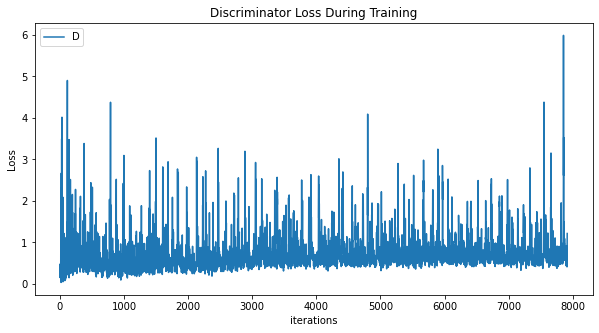

In [30]:
plt.figure(figsize=(10,5))
plt.title("Discriminator Loss During Training")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

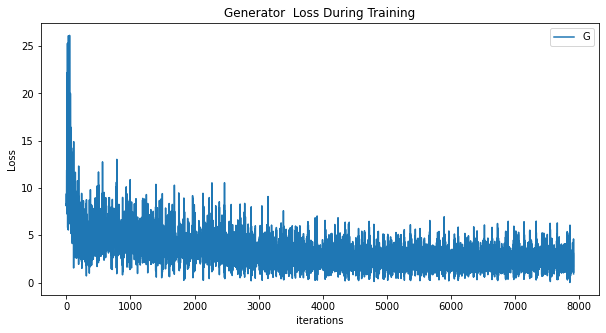

In [29]:
plt.figure(figsize=(10,5))
plt.title("Generator  Loss During Training")
plt.plot(G_losses,label="G")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


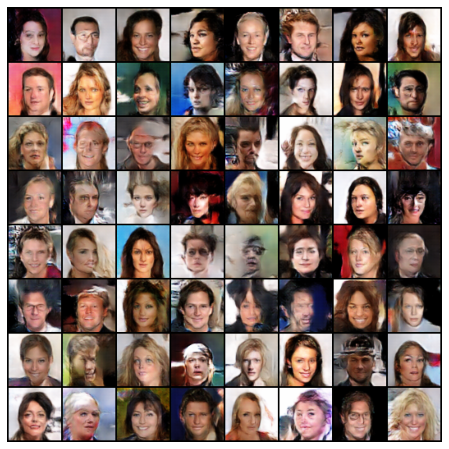

In [27]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [31]:
torch.save(netD.state_dict(), './d')
torch.save(netG.state_dict(), './g')